In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image
import pandas as pd
from matplotlib import cm
import os

In [2]:
# import myfunction 
import myfunc as f

OSError: Could not find lib c or load any of its variants [].

## Global Marine Data

By navigating the noaa website (https://www.ncei.noaa.gov/support/access-data-service-api-user-documentation, https://www.ncei.noaa.gov/access/search/index), I decided to aquire data using the api service. Since the dataset is extremely large, I decided to get data for every 10 days for my analysis. I choose to save the data into csv file to avoid unnecessary requests. <p>
After running the function, I was only able to get data until 2020-4-30. Thus, I will focus my analysis and animation on date from 2018.11.1 to 2020.4.30.

Run only once the following cell, take about 2.5 hours.

In [ ]:
#f.get_data(2018,11,12)
#f.get_data(2019,1,12)
#f.get_data(2020,1,6)

Munipulate the data file and create make gif function

In [4]:
# get all data file 
data = [file for file in sorted(os.listdir("data/")) if file[0] == "2"]

In [5]:
# make gif function 
import imageio
def makegif(data, element):
    # create all maps for all the date
    for file in data:
        f.global_map("data/"+file,file[:-4],element);

    # create gif
    # listing of the directory
    filenames=sorted(os.listdir(element+'/')) 
    images = [] 
    for file in filenames: # step through all the maps
        if '.png' in file: # skip files that are not png
            filename=element+'/'+file # make filename from the folder name and the file name
            images.append(imageio.imread(filename)) # store all png in to the images list
    kargs={'duration':.3} # .3 second delay between frames
    imageio.mimsave(element+'/'+element+'.gif', images,'GIF',**kargs) # save to an animated gif. 

## Analysis

### Sea Surface Temperature (SST)
#### Sea temperature change over the time interval (GIF)

In [6]:
#makegif(data,"SEA_SURF_TEMP") 

run the above function to create the following gif

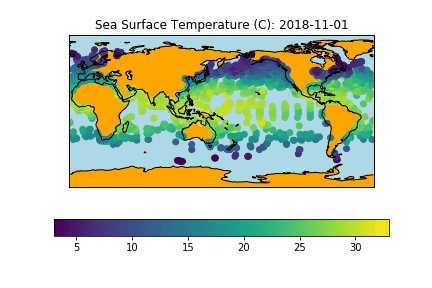

In [7]:
Image(filename="SEA_SURF_TEMP/SEA_SURF_TEMP.gif")

#### SST difference in the same month between two year  (latter year minus former year)

We know that the El nino effect is stronger around the winter time. Checking on the plot, see the same trend.

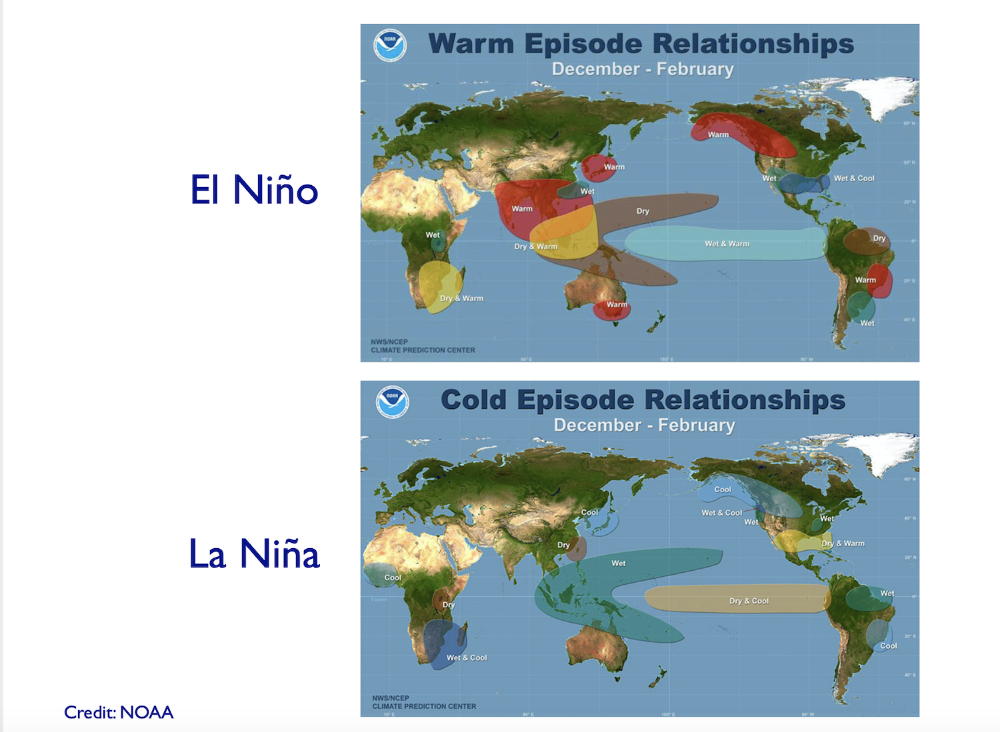

In [8]:
Image(filename="figure/elnino.png")
# citation: 
# picture source: from PPT in BIEB174 class FA18)

Compare 2018 Dec and 2019 Dec.

<Figure size 432x288 with 0 Axes>

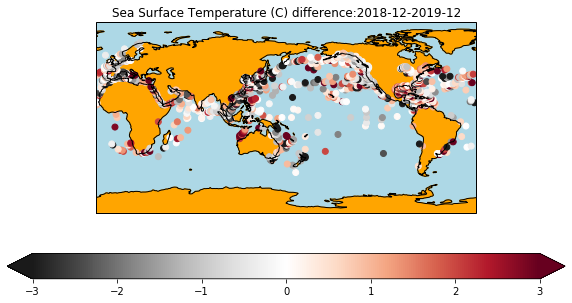

In [9]:
f.diff_map("2018-12","2019-12","SEA_SURF_TEMP")

Compare 2019 Jan and 2020 Jan.

<Figure size 432x288 with 0 Axes>

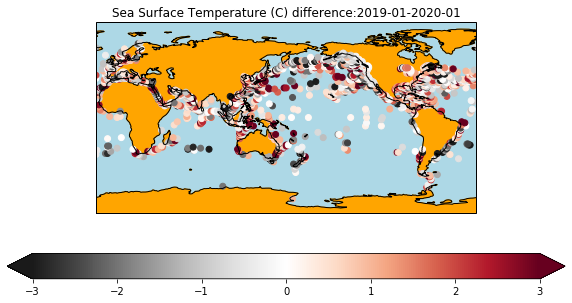

In [10]:
f.diff_map("2019-01","2020-01","SEA_SURF_TEMP")

Compare 2019 Feb and 2020 Feb.

<Figure size 432x288 with 0 Axes>

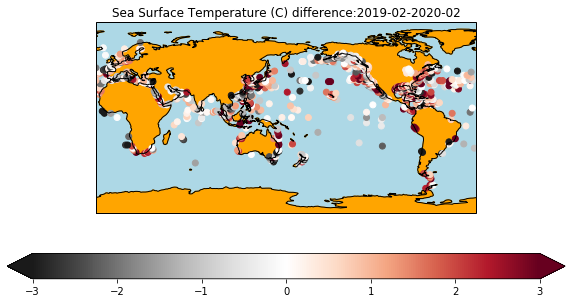

In [11]:
f.diff_map("2019-02","2020-02","SEA_SURF_TEMP")

### Air Temperature
#### Air temperature change over the time interval (GIF)

Check on the air tempeature change. Air temperture usually change more than the sea surface temperature, then I use the boundary from -10 to 35.

In [12]:
#makegif(data,"AIR_TEMP")

run the above function to create the following gif

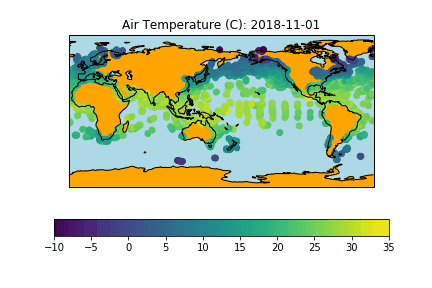

In [13]:
Image(filename="AIR_TEMP/AIR_TEMP.gif")

#### Air temp difference in the same month between two year  (latter year minus former year)

<Figure size 432x288 with 0 Axes>

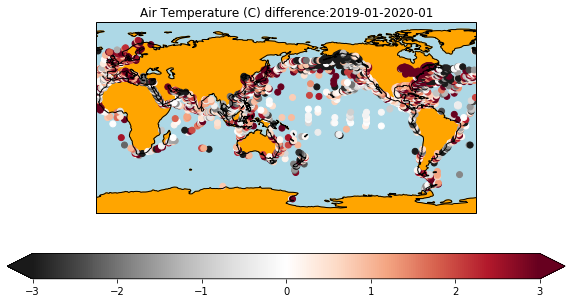

In [14]:
f.diff_map("2019-01","2020-01","AIR_TEMP")

### Sea Level Pressure 
#### Sea level pressure change over the time interval (GIF)

In [37]:
#makegif(data,"SEA_LVL_PRES")

run the above function to create the following gif

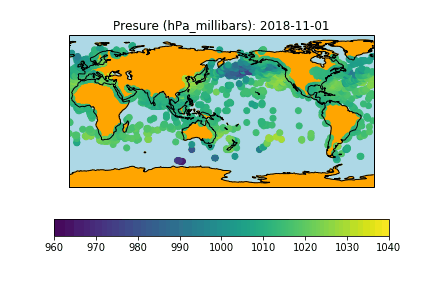

In [16]:
Image(filename="SEA_LVL_PRES/SEA_LVL_PRES.gif")

#### Pressure difference in the same month between two year  (latter year minus former year)

<Figure size 432x288 with 0 Axes>

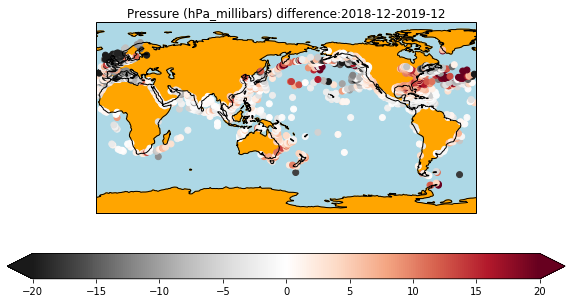

In [17]:
f.diff_map("2018-12","2019-12","SEA_LVL_PRES")

We found out specifically at January, the pressure is much larger in 2020 than 2019.

<Figure size 432x288 with 0 Axes>

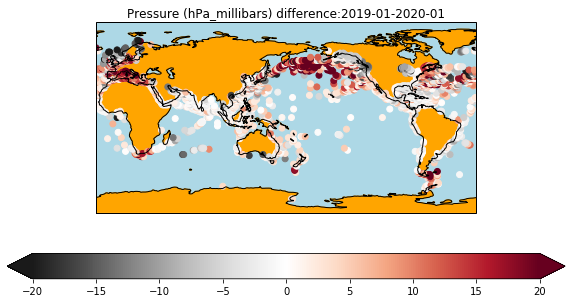

In [18]:
f.diff_map("2019-01","2020-01","SEA_LVL_PRES")

<Figure size 432x288 with 0 Axes>

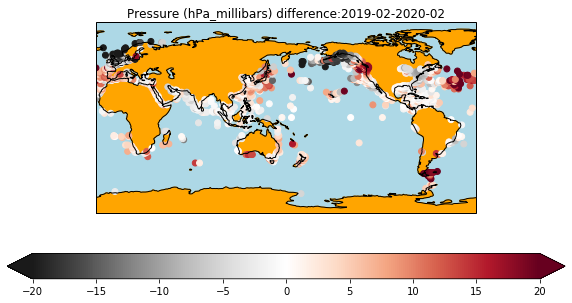

In [19]:
f.diff_map("2019-02","2020-02","SEA_LVL_PRES")

### Part 1 Conclusion
By looking through the above plot, we found out the **end of 2018 and the begining of 2019** is more likely to be a **El nino** year, and the **next year** should be more likely be **La nina** year. However, more analysis shoule be done to make accurate conclusion. <p>
**Data Limitation:** 
    I also aware my data limitation, since for the month analysis, I only use data from about three days. Some extreme condition may appear to alter my results. For example, rainstorm, tornado, or volcano eruptions.

## Additional analysis and plot
### Wind Map
I also create a function to make a plot for wind map. Using the wind direction and wind speed data to calculate the total wind vector in each latitude longitude combination, and plot the map. <p>
Since I did not classify the wind into bigger location block, the map seems massy.

<Figure size 432x288 with 0 Axes>

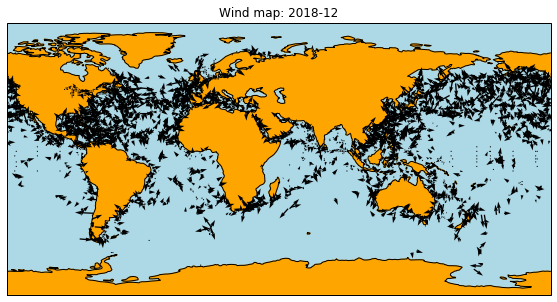

In [22]:
f.plotwind("2018-12")

<Figure size 432x288 with 0 Axes>

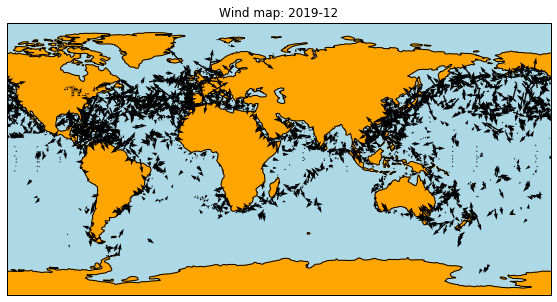

In [23]:
f.plotwind("2019-12")

<Figure size 432x288 with 0 Axes>

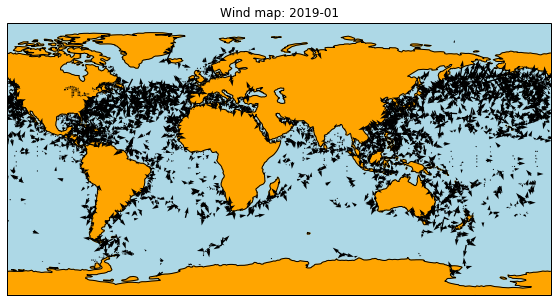

In [24]:
f.plotwind("2019-01")

<Figure size 432x288 with 0 Axes>

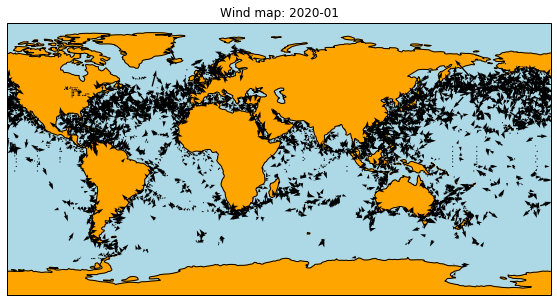

In [25]:
f.plotwind("2020-01")

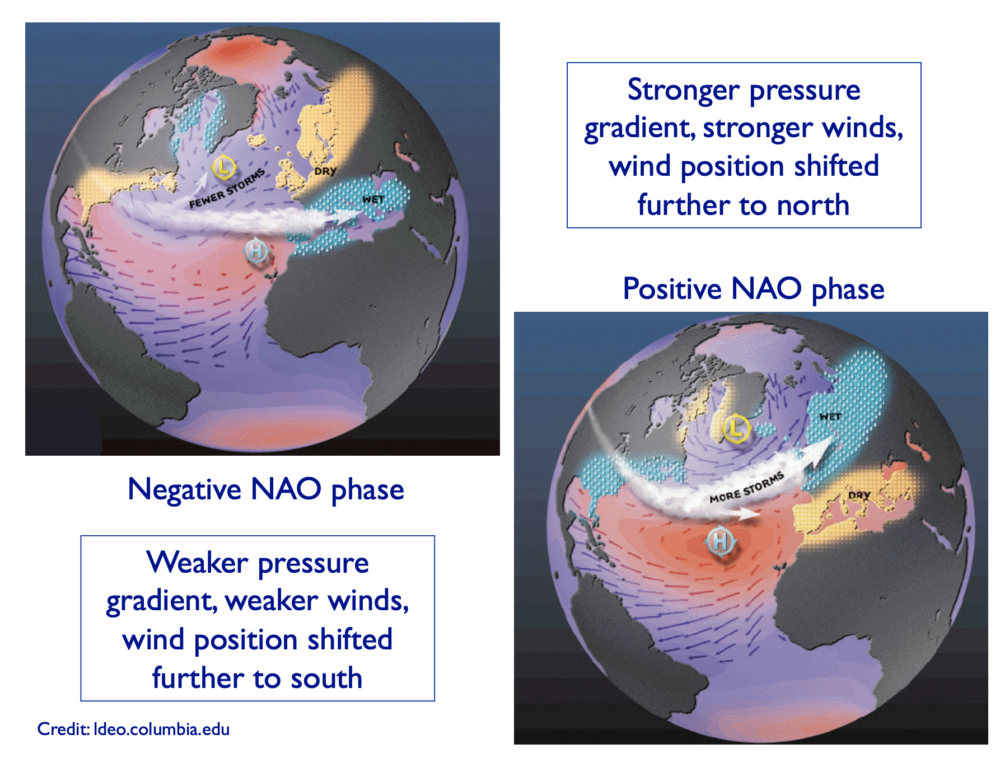

In [26]:
Image(filename="figure/wind.png")
# citation: 
# picture source: from PPT in BIEB174 class FA18)

### Part 2 Conclusion
I did not find obvious trend in the wind direction becuase too many data point presented. Thus, I cannot draw conclusion between wind and the El nino effects.  <p>
Maybe later work can be done to analyze the wind by classify to bigger block.

## San Diego Weather

Data aquired from NOAA, order screenshot attached.

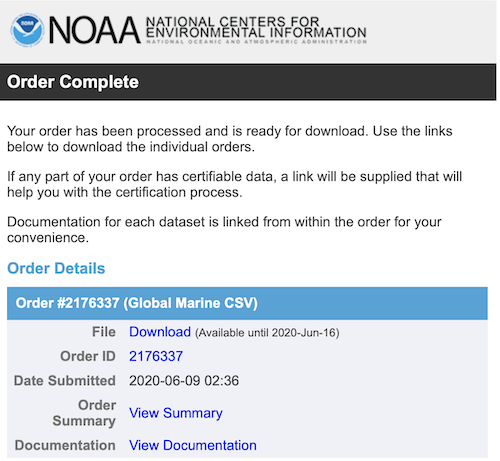

In [27]:
Image(filename="figure/data_order.png")

#### Data

In [28]:
sd = pd.read_csv("data/san_diego.csv",low_memory= False)

In [29]:
sd = sd.drop(columns = ['AMT_PRES_TEND','ATTM_CT', 'CHAR_PPP', 'CLD_HGT', 'CONCEN_OF_SEA_ICE', 'DECK',
       'DEW_PT_TEMP', 'DIR_OF_SWELL2', 'DPT_IND', 'DUP_CHK', 'DUP_STATUS',
       'HGT_OF_SWELL2', 'HI_CLD_TYPE', 'ICE_OF_LAND_ORIGIN', 'ICE_SIT_TREND',
       'ID_IND', 'IMMA_VER', 'IND_FOR_PRECIP', 'IND_FOR_TEMP', 'IND_FOR_WBT',
       'LL_IND', 'LOW_CLD_AMT', 'LOW_CLD_TYPE', 'MID_CLD_TYPE',
       'NAT_SOURCE_IND', 'NCDC_QC_FLAGS', 'NIGHT_DAY_FLAG', 'ONE_BOX_NUM',
       'PAST_WX', 'PAST_WX2', 'PER_OF_SWELL2', 'PLATFORM_ID', 'PRES_WX',
       'RATE_OF_I', 'SEA_LVL_PRES', 'SEA_SURF_TEMP', 'SHIP_COURSE', 'SHIP_SPD',
       'SOURCE_EXCLUSION_FLAG', 'SOURCE_ID', 'SST_MM', 'STAGE_OF_DEVELP',
       'STA_WX_IND', 'SWELL_DIR', 'SWELL_HGT', 'SWELL_PERIOD', 'TEN_BOX_NUM',
       'THICKNESS_OF_I', 'TIME_IND', 'TOT_CLD_AMT', 'TRIM_FLAG',
       'TRUE_BEARING_ICE_EDGE', 'VISIBILITY', 'WAVE_HGT', 'WAVE_PERIOD',
       'WET_BULB_TEMP'])

In [30]:
# manipulate the date time, to drop all time, leave only date
def droptime(time):
    return pd.to_datetime(time).date()
sd["DATE"] = sd["DATE"].apply(droptime)

In [31]:
# get the wind speed data
wind = sd.dropna(subset = ["WIND_SPEED"])
wind = sd.groupby(["DATE"])["WIND_SPEED"].mean()

In [32]:
# get the temperature data
temp = sd.dropna(subset = ["AIR_TEMP"])
temp = sd.groupby(["DATE"])["AIR_TEMP"].mean()

#### Plot wind

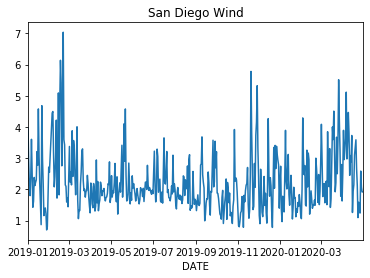

In [33]:
wind.plot(title = "San Diego Wind");

#### Plot Temperature

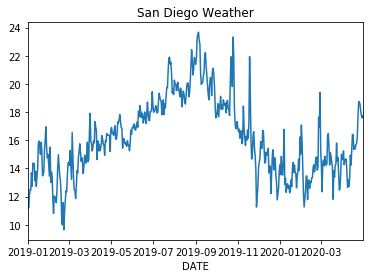

In [34]:
temp.plot(title = "San Diego Weather");


### Conclusion for San Diego Weather
I originally plan to do a analysis on relationship of ocean surface temperture change to San Diego weather; however, the process seems too compicated, and I need to a lot of data analysis from the dataset I currenctly have. <p>
Thus I did a simple plot on the data I ordered from the NOAA site to check the correctness of the data. (I order by sepecify the latitude and longitude info and the time range). It turns out that the data should be correct dataset for san diego weather.<p>

## Appendix (functions attached below)

In [ ]:
#%%writefile myfunc.py
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import pandas as pd
from matplotlib import cm
import os

import cartopy
import cartopy.crs as ccrs
from cartopy import config
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy import feature as cfeature
from cartopy.feature import NaturalEarthFeature, LAND, COASTLINE, OCEAN, LAKES, BORDERS

import requests

def get_data(year, month_start, month_end):
    # acquire dataset using api
    # citation: https://www.ncei.noaa.gov/support/access-data-service-api-user-documentation
    """
    Given a year, start month and end month, get the detail global marine data for every 10 days.
    Then write the data as csv file, the filename as the date.
    
    Parameters: 
    year: the year we want to aquire data for
    month_start: the starting month in the given year
    month_end: the ending month in the given year
    
    Returns: 
    None
    """
    # creat the time range for the given parameter
    if month_end == 12:
        rang = list(pd.date_range(start = str(month_start)+"/1/"+str(year), 
                                  end = "1/1/"+str(year+1)))
    else:
        rang = list(pd.date_range(start = str(month_start)+"/1/"+str(year), 
                                  end = str(month_end+1)+"/1/"+str(year)))
    
    # api endpoint 
    endpoint = "https://www.ncei.noaa.gov/access/services/data/v1?dataset=global-marine&\
    dataType=AIR_TEMP&startDate={}&boundingBox=90,-180,-90,180&format=csv"
    
    # get data request for every 10 days
    for i in range(0,len(rang),10):
        date = str(rang[i].date())
        resp = requests.get(endpoint.format(date+"&endDate="+date))
        
        # write the requested data into csv
        f = open(date+".csv", "w")
        f.write(resp.text)
        f.close()
      
    # return nothing 
    return None

def read_table(filename):
    """
    Read in and reduce table
    Parameters: 
        file: the filename we want to read in
    Return: 
        a table with column 'LATITUDE', 'LONGITUDE', 'AIR_TEMP', 'WIND_DIR', 'WIND_SPEED', 'SEA_SURF_TEMP',
        'SEA_LVL_PRES'
    """
    # the column list I want to read in 
    col_list =['LATITUDE', 'LONGITUDE', 
               'AIR_TEMP', 'WIND_DIR', 'WIND_SPEED', 'SEA_SURF_TEMP', 'SEA_LVL_PRES']
    # read in table with only the above column list
    df = pd.read_csv(filename, usecols = col_list)
    
    # make all latitude and longitude into to int (will reduce later table size)
    df["LATITUDE"] = df["LATITUDE"].astype(int)
    df["LONGITUDE"] = df["LONGITUDE"].astype(int)
    
    # according to the documentation, tempeture is at tenth of the celsius
    df["AIR_TEMP"] = df["AIR_TEMP"]/10
    df["SEA_SURF_TEMP"] = df["SEA_SURF_TEMP"]/10
    df["SEA_LVL_PRES"] = df["SEA_LVL_PRES"]/10
    # return the table 
    return df

def global_map(file,date,element):
    """
    Generates a global map of the desired geomagnetic element.  
    Parameters: 
        file: the filename we want to read in
        date: corresponding date for the file
        element: desired element for the map
            Allowed elements are:
            AIR_TEMP (air temperture),
            SEA_SURF_TEMP (sea surface temperature), 
            SEA_LVL_PRES (sea level pressure)
    Return: 
        None
    """
    # read in table
    df = read_table(file)
    df = df.dropna(subset = [element])
    df = df.groupby(["LATITUDE","LONGITUDE"],as_index = False)[element].mean()
    
    #print(df[element].min(),df[element].max())
    # set title and vmin and vmax according to the data
    if element=='AIR_TEMP':
        title='Air Temperature (C)'
        mi = -10
        ma = 35
    elif element=='SEA_SURF_TEMP':
        title='Sea Surface Temperature (C)'
        mi = 3
        ma = 33
    elif element=='SEA_LVL_PRES':
        title = 'Presure (hPa_millibars)'
        mi = 960
        ma = 1040
        
    # make the map
    plt.clf() #clear the plot to avoid seeing multiple times
    ax1 = plt.axes(projection=ccrs.PlateCarree(central_longitude=160.0))
    ax1.add_feature(OCEAN,color='lightblue')
    ax1.add_feature(LAND,color='orange')
    ax1.coastlines();
    # plot the data point 
    plt.scatter(df.LONGITUDE,df.LATITUDE,c=df[element],
                vmin = mi, vmax = ma,transform=ccrs.PlateCarree());
    plt.colorbar(orientation="horizontal",spacing = "uniform")
    ax1.set_global();
    # assigns title

  
    plt.title(title+": "+date); 
    if element not in os.listdir():
        os.mkdir(element)
    plt.savefig(element+'/'+title+'_'+date+'.png') # saves the  figure. to a folder
    return None

def diff_map(before,after,element):
    """
    Generates a global map of the desired geomagnetic element.  
    Parameters: 
        file: the filename we want to read in
        date: corresponding date for the file
        element: desired element for the map
            Allowed elements are:
            AIR_TEMP (air temperture),
            SEA_SURF_TEMP (sea surface temperature), 
            SEA_LVL_PRES (sea level pressure)
    Return: 
        None
    """
    
    # read in table (all table for the month)
    filenames=sorted(os.listdir('data/')) 
    df1 = []
    df2 = []
    for file in filenames:
        if file[:7] == before:
            if len(df1) == 0:
                df1 = read_table('data/'+file)
            else:
                df1 = df1.append(read_table('data/'+file))
        elif file[:7] == after:
            if len(df2) == 0:
                df2 = read_table('data/'+file)
            else:
                df2 = df2.append(read_table('data/'+file))
    
    # do some modification to the table
    df1 = df1.dropna(subset = [element])
    df1 = df1.groupby(["LATITUDE","LONGITUDE"],as_index = False)[element].mean()
    df2 = df2.dropna(subset = [element])
    df2 = df2.groupby(["LATITUDE","LONGITUDE"],as_index = False)[element].mean()
    
    diff = df1.merge(df2,on = ["LATITUDE","LONGITUDE"],suffixes=[before[:4], after[:4]])
    diff[element+"_diff"] = diff[element+after[:4]] - diff[element+before[:4]]

    # assigns title
    if element=='AIR_TEMP':
        title='Air Temperature (C)'
        mi = -3
        ma = 3
    elif element=='SEA_SURF_TEMP':
        title='Sea Surface Temperature (C)'
        mi = -3
        ma = 3
    elif element=='SEA_LVL_PRES':
        title = 'Pressure (hPa_millibars)'
        mi = -20
        ma = 20
  
    
    # make the map
    # plot point plot with geoplot

    plt.clf() #clear the plot to avoid seeing multiple times
    plt.figure(figsize = (10,5))
    ax1 = plt.axes(projection=ccrs.PlateCarree(central_longitude=160.0))
    ax1.add_feature(OCEAN,color='lightblue')
    ax1.add_feature(LAND,color='orange')
    ax1.coastlines();
    
    # plot the diff graph
    plt.scatter(diff.LONGITUDE,diff.LATITUDE,c=diff[element+"_diff"],
                vmin = mi, vmax = ma, cmap='RdGy_r',transform=ccrs.PlateCarree());
    plt.colorbar(orientation="horizontal",extend ="both",spacing = "uniform")

    ax1.set_global();
    # plot title
    plt.title(title+" difference:"+before+'-'+after); 
    # save image
    if element not in os.listdir():
        os.mkdir(element)
    plt.savefig(element+'/'+title+'_month_'+after[5:7]+'.png') # saves the  figure. to a folder
    return None


# helper function to plot wind
def to_uv(winddir, windspeed):
    """
    Find u and v vector given wind direction and speed
    Parameters: 
        winddir: wind direction (0-360)
        windspeed: wind speed 
    Return:
        the corresponding u and v
    """
    u = np.cos(90-winddir)*windspeed
    v = np.sin(90-winddir)*windspeed
    return u,v


def plotwind(date):
    """
    Generates a global map of the wind of given date
    Parameters: 
        file: the filename we want to read in
        title: the date of the map  
    Return: 
        None
    """
    filenames=sorted(os.listdir('data/')) 
    df = []
    for file in filenames:
        if file[:7] == date:
            if len(df) == 0:
                df = read_table('data/'+file)
            else:
                df = df.append(read_table('data/'+file))
    # drop all nans
    df = df.dropna(subset = ["WIND_DIR","WIND_SPEED"])
    # find u and v
    df["u"],df["v"] = to_uv(df["WIND_DIR"],df["WIND_SPEED"])
    df = df.groupby(["LATITUDE","LONGITUDE"],as_index = False)["u","v"].mean()

          
    plt.clf()
    plt.figure(figsize = (10,5))
    ax1 = plt.axes(projection=ccrs.PlateCarree(central_longitude=50.0))
    ax1.add_feature(OCEAN,color='lightblue')
    ax1.add_feature(LAND,color='orange')
    ax1.coastlines();
    # using quiver function to plot the arrow
    plt.quiver(np.array(df.LONGITUDE),np.array(df.LATITUDE),
               np.array(df["u"]),np.array(df["v"]),color='k',transform=ccrs.PlateCarree(),norm = True);
    ax1.set_global();
    plt.title("Wind map: "+date); 
    plt.savefig("Wind/"+date+'.png',quality = 95) # saves the  figure. to a folder
    return None #Image(filename="Wind/"+date+'.png')